# Import Libraries (you don't say! )

In [127]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import seaborn as sns
import datetime
import csv
import folium
import json
from folium import plugins


%matplotlib inline
pd.set_option("display.max.columns", None)

# Data Cleaning

below, I will perform some data cleaning.

- read 4 datasets, 2 for boston, 2 for seattle
- merge relevant tables to one dataframe
- convert date to datetime
- add day of the week to calendar df for further analysis
- add month column to df_cal
- convert percent columns to floats for readablility
- convert price to float for readablility
- remove columns that wil not be used in this analysis
- convert boean columns (t / f) to (1 / 0)

In [128]:
#read dfs
cal_boston = pd.read_csv('calendar_boston.csv')
list_boston = pd.read_csv('listings_boston.csv')

cal_seattle = pd.read_csv('calendar_seattle.csv')
list_seattle = pd.read_csv('listings_seattle.csv')

#merge dfs
df_list = pd.concat([list_boston, list_seattle])
df_cal = pd.concat([cal_boston, cal_seattle])

#convert date column to datetime
df_cal['date'] = pd.to_datetime(df_cal['date'])


#create weekday column
df_cal['weekday'] = df_cal['date'].dt.day_name()
df_cal['month'] = df_cal['date'].dt.month_name()


In [129]:
#convert rates from percents to floats
df_list['host_response_rate'] = df_list['host_response_rate'].apply(lambda x: str(x).replace('%', ''))
df_list['host_response_rate'] = df_list['host_response_rate'].apply(lambda x: float(x) / 100)

df_list['host_acceptance_rate'] = df_list['host_acceptance_rate'].apply(lambda x: str(x).replace('%', ''))
df_list['host_acceptance_rate'] = df_list['host_acceptance_rate'].apply(lambda x: float(x) / 100)

#convert prices to float (remove currency / remove commas)
df_list['price_dollar'] = df_list['price'].apply(lambda x: x.replace('$', '').replace(',', ''))
df_list['price_dollar'] = df_list['price_dollar'].apply(lambda x: float(x))

#convert object to float and remove currency
df_list['security_deposit'] = df_list.security_deposit.apply(lambda x: str(x).replace('$', '').replace(',','')).apply(lambda x: float(x))
df_list['cleaning_fee'] = df_list.cleaning_fee.apply(lambda x: str(x).replace('$', '').replace(',','')).apply(lambda x: float(x))
df_list['extra_people'] = df_list.extra_people.apply(lambda x: str(x).replace('$', '').replace(',','')).apply(lambda x: float(x))




In [130]:
#removing columns that wil not be used in this analysis
df_list = df_list.dropna(axis=1, how='all')
df_list = df_list.drop(columns=['listing_url', 'scrape_id', 'last_scraped', 'experiences_offered', 'thumbnail_url','medium_url', 'house_rules', 'interaction', 'access', 'transit', 'notes', 'picture_url','summary', 'space', 'xl_picture_url', 'host_url', 'host_about', 'host_thumbnail_url','host_picture_url', 'market', 'smart_location', 'country_code', 'calendar_last_scraped', 'first_review','last_review', 'description', 'neighborhood_overview', 'price', 'neighbourhood', 'country', 'square_feet', 'jurisdiction_names','host_name', 'requires_license' ])

In [95]:
# has_availability (only true)
# requires_license (only false)

#convert t & f to bolean values (1 for true, 0 for false) (list df)
df_list[['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'is_location_exact',
         'has_availability', 'instant_bookable', 'require_guest_profile_picture',
         'require_guest_phone_verification']] = df_list[['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'is_location_exact',
         'has_availability', 'instant_bookable', 'require_guest_profile_picture',
         'require_guest_phone_verification']].apply(lambda x: x.replace('t', 1).replace('f', 0))


#convert t & f to bolean values (1 for true, 0 for false) (cal df)
df_cal[['available']] = df_cal[['available']].apply(lambda x: x.replace('t', 1).replace('f', 0))


#handling edge case, where false is considered nan here
df_list['has_availability'] = df_list['has_availability'].fillna(0)

#convert bolean columns from float to int
df_list[['host_is_superhost','host_has_profile_pic', 'host_identity_verified', 'has_availability']] = df_list[['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'has_availability']].fillna(0).astype(int)



In [96]:
#convert object to float, remove currency and comma 
df_cal['price_cleaned'] = df_cal['price'].apply(lambda x: str(x).replace('$', '').replace(',', ''))
df_cal['price_cleaned'] = df_cal['price_cleaned'].apply(lambda x: float(x))
df_cal = df_cal.drop(columns='price')

In [97]:
df_list.describe()

,id,host_id,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,is_location_exact,accommodates,bathrooms,bedrooms,beds,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,price_dollar
count,7.403000e+03,7.403000e+03,6409.000000,6159.000000,7403.000000,7401.000000,7401.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7373.000000,7387.000000,7393.000000,3208.000000,5266.000000,7403.000000,7403.000000,7403.000000,7.403000e+03,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,7403.000000,5943.000000,5922.000000,5932.000000,5925.000000,5934.000000,5926.000000,5926.000000,7403.000000,7403.000000,7403.000000,7403.000000,6020.000000,7403.000000
mean,6.950001e+06,2.021053e+07,0.949365,0.919817,0.160070,32.222537,32.222537,0.997704,0.756450,45.067727,-97.515448,0.876942,3.200189,1.241150,1.282659,1.674286,303.125312,64.849221,1.555045,10.773470,2.757666,1.431337e+04,0.515737,12.846143,29.559773,48.627583,213.089153,20.684047,93.316002,9.540865,9.417229,9.721181,9.733569,9.518056,9.319777,0.160070,0.052411,0.082669,7.686073,2.028161,150.227881
std,4.052397e+06,1.962309e+07,0.121865,0.174292,0.366696,123.585161,123.585161,0.047869,0.429253,2.643568,25.613198,0.328526,1.890166,0.549408,0.823251,1.081355,296.689874,50.112558,1.200756,18.352897,13.243828,1.162232e+06,0.499786,12.069956,23.839400,35.013315,138.342837,36.733024,8.207451,0.821783,0.999271,0.682247,0.656589,0.775312,0.892824,0.366696,0.222870,0.275400,21.465871,1.968696,124.019680
min,3.335000e+03,4.193000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,42.235942,-122.417219,0.000000,1.000000,0.000000,0.000000,0.000000,95.000000,5.000000,0.000000,0.000000,1.000000,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.010000,10.000000
25%,3.864100e+06,4.343164e+06,0.970000,0.940000,0.000000,1.000000,1.000000,1.000000,1.000000,42.345668,-122.330837,1.000000,2.000000,1.000000,1.000000,1.000000,149.750000,25.000000,1.000000,0.000000,1.000000,9.550000e+01,0.000000,0.000000,1.000000,7.000000,77.000000,1.000000,91.000000,9.000000,9.000000,10.000000,10.000000,9.000000,9.000000,0.000000,0.000000,0.000000,1.000000,0.590000,79.000000
50%,7.035240e+06,1.448650e+07,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,47.542907,-122.276419,1.000000,2.000000,1.000000,1.000000,1.000000,250.000000,50.000000,1.000000,0.000000,2.000000,1.125000e+03,1.000000,10.000000,31.000000,56.000000,259.000000,7.000000,96.000000,10.000000,10.000000,10.000000,10.000000,10.000000,9.000000,0.000000,0.000000,0.000000,1.000000,1.370000,120.000000
75%,9.500804e+06,3.028359e+07,1.000000,1.000000,0.000000,4.000000,4.000000,1.000000,1.000000,47.624460,-71.079518,1.000000,4.000000,1.000000,2.000000,2.000000,400.000000,95.000000,2.000000,20.000000,3.000000,1.125000e+03,1.000000,26.000000,55.000000,84.000000,347.000000,23.000000,99.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,0.000000,0.000000,0.000000,3.000000,2.890000,190.000000
max,1.493346e+07,9.385411e+07,1.000000,1.000000,1.000000,749.000000,749.000000,1.000000,1.000000,47.733358,-71.000100,1.000000,16.000000,8.000000,7.000000,16.000000,5000.000000,300.000000,15.000000,300.000000,1000.000000,1.000000e+08,1.000000,30.000000,60.000000,90.000000,365.000000,474.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000

# Question 1: Do prices surge in particular days and months?

as illlustrated below, on weekends, there's on average, about 1.03 surge on listing prices over weekday prices.

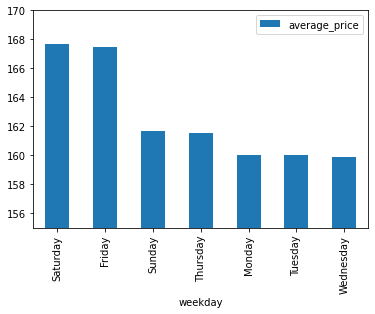

In [98]:
#creating and ploting a dataframe of avergae prices grouped by weekday,  sort by highest prices
day_prices = df_cal.loc[df_cal['available'] == 1].drop(columns=['available', 'date', 'listing_id']).groupby(by='weekday')['price_cleaned'].mean().sort_values(ascending=False).reset_index()
day_prices['average_price'] = day_prices['price_cleaned']
day_prices.plot('weekday', 'average_price',kind='bar', use_index=True, ylim=(155, 170));

**looking at month's average price:**

there's around 1.09 surge in prices in summer months over winter months. Which makes sense given it's holiday time almost everywhere  

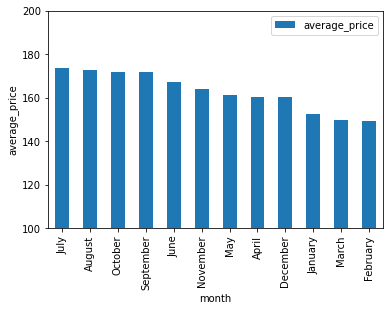

In [99]:
#creating and ploting a dataframe of avergae prices grouped by month, sort by highest prices
month_prices = df_cal.loc[df_cal['available'] == 1].drop(columns=['available', 'date', 'listing_id']).groupby(by='month')['price_cleaned'].mean().sort_values(ascending=False).reset_index()
month_prices['average_price'] = month_prices['price_cleaned']
month_prices.plot('month', 'average_price',kind='bar', use_index=True, ylim=(100, 200), ylabel='average_price');

# Question 2: Which variables have the strogest correlation to price, and ratings?

**The first heatmap I looked at was the correlation between price and the different scores variables to see which one has the strogest correlation. I found out the following:**

- highest correlation with price is location scores, which means listings in good locations are offered with high prices

- location score have the lowest correlation with the overall scores, that means, a listing can have a high scores in all aspects even though it is in a bad location.

- review accuracy scores are highly corrlated with reivew value scores, which indicates that if users get the listing as presented on Aribnb for them, they'd consider the listing as a good value. For cleanliness, it means that the cleaner the room, the greater the value is for a user.

- review cleanliness scores are also highly corrlated with reivew value scores, which means that the cleaner the room, the greater the value is for a user.

**These are the descriptions of ratings from Airbnb Help Center:**

- Overall experience. How was it?
- Cleanliness. Did the place meet our standards?
- Accuracy. Was it accurately represented with up-to-date photos and info?
- Check-in. Should be easy.
- Communication. Did the Host respond to messages promptly?
- Location. Was the guest made aware of safety, transportation, points of interest and special
- Value. Was it worth the price?

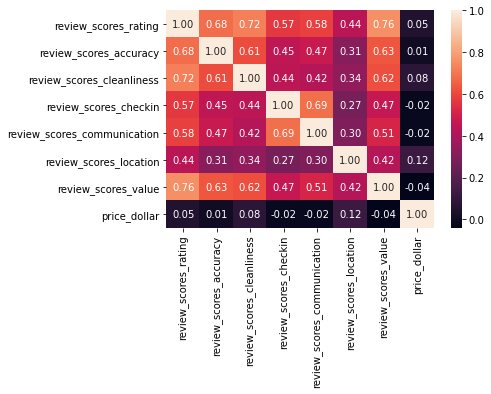

In [100]:
rating_and_price = df_list[['review_scores_rating','review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location', 'review_scores_value', 'price_dollar']]

sns.heatmap(rating_and_price.corr(), annot=True, fmt=".2f");

**The second heatmap I looked at is**

I ran a correlation heatmap below. I didn't find a lot of intresting insights here, but here's what it suggest:

- the strongest correlation with price was: how many allowed accommodates are allowed, number of bedrooms and rooms
- bedrooms, bathrooms, and beds, have high correlation with each other, more bedrooms equals more bathrooms and more beds per room
- score rating doesn't seem to be affected by room counts


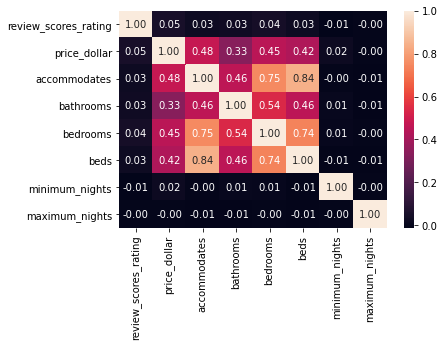

In [101]:
listing_details = df_list[['review_scores_rating', 'price_dollar', 'accommodates', 'bathrooms', 'bedrooms',
                          'beds', 'minimum_nights', 'maximum_nights']]

sns.heatmap(listing_details.corr(), annot=True, fmt=".2f");

# Question 3: How are listings distributed in the city?

refrence to this analysis is from this article: https://towardsdatascience.com/making-3-easy-maps-with-python-fb7dfb1036

**Notes on Boston:**

**Notes on Seattle:**

In [102]:
# store geojson files for Boston & Seattle
with open('boston_map.geojson') as f:
    boston_area = json.load(f)
    
with open('seattle_map.geojson') as f:
    seattle_area = json.load(f)
    
# create a subset that only contains map retalted variables
df_map = df_list[['id', 'neighbourhood_cleansed', 'city', 'state', 'zipcode', 'latitude', 'longitude', 'price_dollar', 'review_scores_rating']]

In [103]:
#initialize the map around Boston & Seattle
boston_map = folium.Map(location=[42.364506,  -71.038887], tiles='OpenStreetMap', zoom_start=12)
seattle_map = folium.Map(location=[47.6062,  -122.3321], tiles='OpenStreetMap', zoom_start=12)

#add the shape of Boston & Seattle to the map
folium.GeoJson(boston_area).add_to(boston_map)
folium.GeoJson(seattle_area).add_to(seattle_map)

#for each row in the dataset, plot the corresponding latitude and longitude on the map
for i,row in df_map.iterrows():
    folium.CircleMarker((row.latitude,row.longitude), radius=3, weight=2, color='red', fill_color='white', fill_opacity=.5).add_to(boston_map)

for i,row in df_map.iterrows():
    folium.CircleMarker((row.latitude,row.longitude), radius=3, weight=2, color='red', fill_color='white', fill_opacity=.5).add_to(seattle_map)

In [104]:
boston_map

In [105]:
seattle_map

In [106]:
# create a subset grouped by zipcodes and counting listings
df_zipcodes = df_map['zipcode'].value_counts().reset_index()
df_zipcodes[['zipcode', 'count']] = df_zipcodes[['index', 'zipcode']]
df_zipcodes = df_zipcodes.drop(columns='index')


# clean bad zipcodes
df_zipcodes['zipcode'] = df_zipcodes['zipcode'].apply(lambda x: x.replace('02108 ', '').replace('-1704', '').replace('99\n', ''))
#df_zipcodes['zipcode'] = df_zipcodes['zipcode'].apply(lambda x: int(x))

# normalized count by 100
df_zipcodes['normalized'] = df_zipcodes['count'].apply(lambda x: (x - min(df_zipcodes['count']))/(max(df_zipcodes['count']) - min(df_zipcodes['count'])) * 100)

In [107]:
# initialize the map around Boston
boston_map_zipcodes = folium.Map(location=[42.364506,  -71.038887], tiles='OpenStreetMap', zoom_start=12)

# plot a map of Boston by matching the df zipcodes with the imported files of Boston zipcodes
boston_map_zipcodes.choropleth(geo_data='boston_zipcodes.geojson', data=df_zipcodes, columns=['zipcode', 'normalized'], \
                 key_on='feature.properties.zipcode', fill_color='RdPu', fill_opacity=.5)


/Users/khalidalolayan/opt/anaconda3/lib/python3.8/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


In [108]:
boston_map_zipcodes

In [109]:
boston_heatmap = folium.Map(location=[42.364506,  -71.038887], tiles='OpenStreetMap', zoom_start=12)
seattle_heatmap = folium.Map(location=[47.6062,  -122.3321], tiles='OpenStreetMap', zoom_start=12)

#add the shape of Boston & Seattle to the map
folium.GeoJson(boston_area).add_to(boston_map)
folium.GeoJson(seattle_area).add_to(seattle_map)

#for each row in the dataset, plot the corresponding latitude and longitude on the map
for i,row in df_map.iterrows():
    folium.CircleMarker((row.latitude,row.longitude), radius=3, weight=2, color='red', fill_color='white', fill_opacity=.5).add_to(boston_map)

for i,row in df_map.iterrows():
    folium.CircleMarker((row.latitude,row.longitude), radius=3, weight=2, color='red', fill_color='white', fill_opacity=.5).add_to(seattle_map)


In [110]:
#plot Boston heatmap
boston_heatmap.add_child(plugins.HeatMap(data=df_map[['latitude', 'longitude']].values, radius=6, blur=5))

In [111]:
#plot Seattle heatmap
seattle_heatmap.add_child(plugins.HeatMap(data=df_map[['latitude', 'longitude']].values, radius=6, blur=5))

In [112]:
def group_and_plot(df, filter_var, filter_val, x_axis, max_x, plot=True):
    '''
    INPUT:
    counts rows and groups by a given column, then plots the data as a bar chart
    - df: a dataframe
    - filter_var: a column to filter
    - filter_val: the filtered value
    - x_axis: the column to group by
    - max_x: max values to display on the x axis
    - plot: If empty or true, will return plot. If false, it wil return df
    
    OUTPUT:
    a bar graph showing the count of rows as y and the grouped column as x
    or
    a df with row counts groupedby ax_axis
    '''
    # subset and group by Boston neighbourhoods, count listing
    df = df.loc[df[filter_var] == filter_val, x_axis].value_counts().sort_values(ascending=False).reset_index().reindex()[:max_x]
    
    #rearrange columns
    df[[x_axis, 'count']] = df[['index', x_axis]]
    df = df.drop(columns='index')
    
    #create normalized column
    df['normalized'] = df['count'].apply(lambda x: (x - min(df['count']))/(max(df['count']) - min(df['count'])) * 100)

    #plotting 
    if plot == True:
        return df.plot(x_axis, 'normalized', kind='bar', use_index=True, ylim=(0, 100));
    else:
        return df

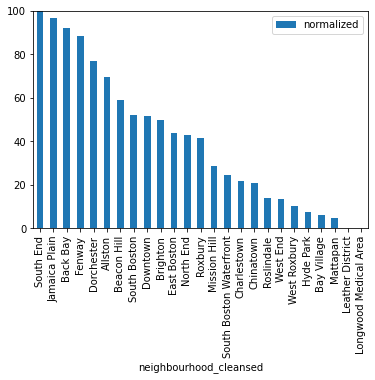

In [113]:
group_and_plot(df_list, 'city', 'Boston', 'neighbourhood_cleansed', 25, plot=True);

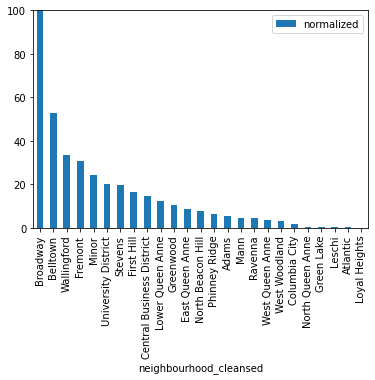

In [114]:
group_and_plot(df_list, 'city', 'Seattle', 'neighbourhood_cleansed', 25);

In [115]:
def average_and_plot(df, filter_var, filter_val, x_axis, avg_var, max_x, plot=True):
    '''
    INPUT
    average of a variable and groups by a given column, then plots the data as a bar chart
    - df: a dataframe
    - filter_var: a column to filter
    - filter_val: the filtered value
    - x_axis: the column to group by
    - avg_var: a column you'd like to average when grouping
    - max_x: max values to display on the x axis
    - plot: If empty or true, will return plot. If false, it wil return df
    
    OUTPUT:
    a bar graph showing the count of rows as y and the grouped column as x
    or
    a df with row counts groupedby ax_axis
     
    '''
    
    #creating a dataframe of avergae prices grouped by x_axis, sort by highest
    df = df.loc[df[filter_var] == filter_val][[x_axis, avg_var]].groupby(by=x_axis)[avg_var].mean().sort_values(ascending=False).reset_index()[:max_x]
    
    #plotting
    if plot == True:
        return df.plot(x_axis, avg_var, kind='barh', ylim=(100, 320))
    else:
        return df


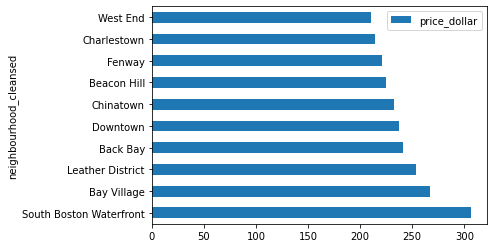

In [116]:
#creating and ploting a dataframe of avergae prices grouped by neighbourhood, sort by highest prices (Boston)
average_and_plot(df_list, 'city', 'Boston', 'neighbourhood_cleansed', 'price_dollar', 10);

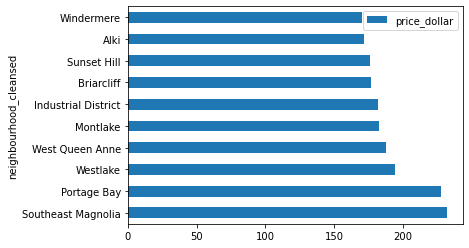

In [117]:
#creating and ploting a dataframe of avergae prices grouped by neighbourhood, sort by highest prices (Seattle)
average_and_plot(df_list, 'city', 'Seattle', 'neighbourhood_cleansed', 'price_dollar', 10);

# Question 4: Does supply affect average prices?

Let's see if more more listings would result in higher or lower average prices

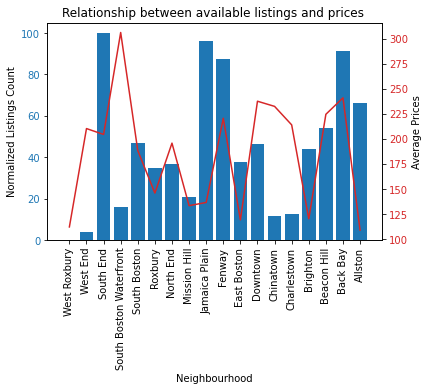

In [118]:
boston_neighbourhood = group_and_plot(df_list, 'city', 'Boston', 'neighbourhood_cleansed', 20, plot=False)
boston_average = average_and_plot(df_list, 'city', 'Boston', 'neighbourhood_cleansed', 'price_dollar', 20, plot=False);
# creating a subset with neighbourhood, average prices, and counts of lstiings
boston_city = pd.merge(boston_neighbourhood, boston_average).sort_values(by='neighbourhood_cleansed', ascending=False)


# plot should show does more avaliable listings affect prices?

# setting x, y, y_1
x = boston_city['neighbourhood_cleansed']
y = boston_city['normalized']
y_1 = boston_city['price_dollar']
#init figure
fig, ax1 = plt.subplots() 

#left axis
color = 'tab:blue'
ax1.set_xlabel('Neighbourhood', color = 'black')
ax1.set_ylabel('Normalized Listings Count') 
ax1.bar(x, y, color = color) 
ax1.tick_params(axis ='y', labelcolor = color) 
ax1.tick_params(axis ='x', labelcolor = 'black', labelrotation=90) 

  
#Adding right axis to plot using y_2
ax2 = ax1.twinx() 
  
#Right axis
color = 'tab:red'
ax2.set_ylabel('Average Prices') 
ax2.plot(x, y_1, color = color) 
ax2.tick_params(axis ='y', labelcolor = color) 
  
#Adding title
plt.title('Relationship between available listings and prices ', fontdict={'fontsize':'12'}) 
  
#Show plot
plt.show()

It's not very clear that more listing result in lower prices, or vice versa

# Linear Regression Modelling 

In [119]:
df_model = df_list[['host_response_time', 'street', 'neighbourhood_cleansed', 'city', 'zipcode', 'property_type',
             'room_type', 'host_verifications', 'bed_type', 'cancellation_policy', 'host_is_superhost', 'host_acceptance_rate', 'host_listings_count', 'host_total_listings_count', 'host_has_profile_pic',
              'host_identity_verified', 'is_location_exact', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'security_deposit', 'cleaning_fee',
              'guests_included', 'extra_people', 'minimum_nights', 'availability_30',
              'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy',
             'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location',
             'review_scores_value', 'instant_bookable', 'require_guest_profile_picture', 'require_guest_phone_verification',
              'calculated_host_listings_count', 'reviews_per_month', 'host_response_rate', 'price_dollar']]


cat_cols = ['host_response_time', 'street', 'neighbourhood_cleansed', 'city', 'zipcode', 'property_type',
             'room_type', 'host_verifications', 'bed_type', 'cancellation_policy']
other_cols = ['host_is_superhost', 'host_acceptance_rate', 'host_listings_count', 'host_total_listings_count', 'host_has_profile_pic',
              'host_identity_verified', 'is_location_exact', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'security_deposit', 'cleaning_fee',
              'guests_included', 'extra_people', 'minimum_nights', 'availability_30',
              'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy',
             'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location',
             'review_scores_value', 'instant_bookable', 'require_guest_profile_picture', 'require_guest_phone_verification',
              'calculated_host_listings_count', 'reviews_per_month', 'host_response_rate']

In [120]:
#modeling without categorical data

#fill nan with mean
fill_mean = lambda col: col.fillna(col.mean())

#apply on df
df_model[other_cols] = df_model[other_cols].apply(fill_mean, axis=0)

#Creat x and y
X = df_model[other_cols]
y = df_model['price_dollar']

#create train, test splits
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=43)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train)

#test and train predictions
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#r_2 score
test_score = r2_score(y_test, y_test_preds)
train_score = r2_score(y_train, y_train_preds)

/Users/khalidalolayan/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [121]:
#check train score
train_score

0.3262905031091201

In [122]:
#check test score
test_score

0.3629255444219359

In [123]:
#function to ctreat dummy var
def create_dummy_df(df, cat_cols, dummy_na):
    '''
    INPUT:
    df - pandas dataframe with categorical variables you want to dummy
    cat_cols - list of strings that are associated with names of the categorical columns
    dummy_na - Bool holding whether you want to dummy NA vals of categorical columns or not
    
    OUTPUT:
    df - a new dataframe that has the following characteristics:
            1. contains all columns that were not specified as categorical
            2. removes all the original columns in cat_cols
            3. dummy columns for each of the categorical columns in cat_cols
            4. if dummy_na is True - it also contains dummy columns for the NaN values
            5. Use a prefix of the column name with an underscore (_) for separating 
    '''
    for col in  cat_cols:
        try:
            # for each cat add dummy var, drop original column
            df = pd.concat([df.drop(col, axis=1), pd.get_dummies(df[col], prefix=col, prefix_sep='_', drop_first=True, dummy_na=dummy_na)], axis=1)
        except:
            continue
    return df

In [124]:


#Model with categorical data


# new df with dummy vars 
df_model_cat_num = create_dummy_df(df_model, cat_cols, dummy_na=False)
df_model_cat_num.shape

#Creat x and y
X_1 = df_model_cat_num.drop(columns=['price_dollar'])
y_1 = df_model_cat_num['price_dollar']

#create train, test splits
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, y_1, test_size=.3, random_state=43)

#Instantiate
lm_model_1 = LinearRegression(normalize=True) 
lm_model_1.fit(X_train_1, y_train_1)

#test and train predictions
y_test_preds_1 = lm_model_1.predict(X_test_1)
y_train_preds_1 = lm_model_1.predict(X_train_1)

#r_2 score
test_score_1 = r2_score(y_test_1, y_test_preds_1)
train_score_1 = r2_score(y_train_1, y_train_preds_1)

In [125]:
print(f"df with out categorical data - test score:{test_score}")
print(f"df with out categorical data - train score:{train_score}")
print("")
print(f"df with categorical data - test score:{test_score_1}")
print(f"df with categorical data - train score:{train_score_1}")

df with out categorical data - test score:0.3629255444219359
df with out categorical data - train score:0.3262905031091201

df with categorical data - test score:-6.330703486355395e+28
df with categorical data - train score:0.5224285960246509
